In [2]:
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

# Helper Functions

## Plotting

In [473]:
# plotly
# cut df by column levels

def cut_column(df, col):
    level = pd.cut(df[col], 4, \
                   include_lowest = True, \
                   labels = ['1 low %s' % col, '2 med %s' % col, '3 high %s' % col, '4 very high %s' % col])
    df[col + '_level'] = level
    return df.copy()

# generic bubble plot

def plot_bubble(df, col):
    df.iplot(kind='bubble', x=x, y=y, size=size, text='country',\
           xTitle=str.title(x), yTitle=y, categories='region', \
             title= str.capitalize('%s vs %s for %s' % (x, y, q)))

def plot_bubble_with_cuts(df, col):
    df = cut_column(df.copy(), col)
    df.iplot(kind='bubble', x=x, y=y, size='population', text='country',\
           xTitle=str.title(x), yTitle=y, categories= col + '_level', logx=True, \
             title= str.title('%s vs %s for %s' % (x, y, q)))

In [462]:
# OBSOLETE??
# reshape original

def reshape_for_plot_old(df):
    #df = df.reset_index().copy()
    name = df.name.split('_')[0]
    df = df.set_index(['region', 'sub-region', 'country'])
    df = df.set_index(['country'])
    df = df.sort_index(level = 0)

    t = df.T
    t = t.unstack(level = 1)
    df = pd.DataFrame(t)
    
    df = df.reset_index()
    df = df.rename(columns={'level_1':'year', 0: name})
    
    # make sure year column is int type
    df['year'] = df['year'].astype('int64')
    df.name = name

    return df

In [4]:
#use chaining
# OBSOLETE?
def reshape_for_plot(df):
    name = df.name.split('_')[0]
    df = df.set_index(['region', 'sub-region', 'country']).sort_index(level = 0)
    #df = df.set_index(['country'])
    df = pd.DataFrame(df.T.unstack(level = 1))
    
    df = df.reset_index().rename(columns={'level_1':'year', 0: name})
    
    # make sure year column is int type
    df['year'] = df['year'].astype('int64')
    df.name = name

    return df


In [5]:
# pandas plotting - REVISE to use groupby as per code in 'Explore'

def reshape_for_pandas_faceting(df, region, value):
    
    # create multi-index and limit df to Europe
    df_region = df.reset_index().set_index(['region', 'sub_region', 'country']).loc[region]

    # transpose df & unstack years columns into single column
    df_region = pd.DataFrame(df_region.T.unstack()).reset_index().rename(columns={'level_2':'year', 0: value})

    return df_region

def pandas_subregion_plot(df, region, value):
    # subset df by region 
    df = df.loc[df['region']==region].copy()
    
    # create spaghetti plot of countries by sub_region
    for subreg in df['sub_region'].unique():
        df.loc[df['sub_region']==subreg].pivot('year', 'country', value).plot()
        plt.title(subreg + ' ' + value)
        
        # Put a legend to the right of the current axis
        plt.legend(loc='center left', bbox_to_anchor=(1,0.5))

# Load Data

In [400]:
mypath = 'data/final/'

filename = 'final_df.csv'
df = pd.read_csv(mypath + filename)

# assign name attribute to df
df.name = filename.split('_')[0]
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,1030.0,NaN,NaN,NaN,0.0477,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,1040.0,NaN,7752118.0,NaN,0.0758,2.89
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,1060.0,NaN,7839426.0,NaN,0.0932,2.89
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,1070.0,NaN,7934798.0,NaN,0.1100,3.02
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,1120.0,NaN,8038312.0,NaN,0.1260,3.02


In [401]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                     17055 non-null object
region                      14970 non-null object
sub-region                  14970 non-null object
year                        17055 non-null int64
CO2_pc                      17055 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  12517 non-null float64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [402]:
# convert year to str
df['year']=df['year'].astype('str')

In [403]:
# for now, just focus on CO2 values
val = 'CO2_pc'
df = df.iloc[:,:5]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 5 columns):
country       17055 non-null object
region        14970 non-null object
sub-region    14970 non-null object
year          17055 non-null object
CO2_pc        17055 non-null float64
dtypes: float64(1), object(4)
memory usage: 666.3+ KB


## Where are the highest & lowest CO2 emissions in 2010?

#### TODO: make a standard query using max year value

In [406]:
# global max
end_yr = str(df['year'].max())
q = 'year == @end_yr'

df[['country', 'year']].loc[df.query(q)[val].idxmax()]

country    Qatar
year        2013
Name: 12154, dtype: object

In [278]:
# top 10 co2 emitters
df.query(q)[['country','co2']].sort_values('co2', ascending=False).head(10)

,country,co2
36293,Qatar,40.45868
18672,Trinidad And Tobago,34.51710
35504,Kuwait,27.25649
33926,Bahrain,23.68042
28403,Brunei,18.91702
37345,United Arab Emirates,18.70654
47865,Luxembourg,18.64675
36556,Saudi Arabia,17.92586
44183,Gibraltar,16.76391
22091,United States,16.35165


In [262]:
# regional max
df.query('year==2010').groupby('region').max()['co2'].sort_values()

region
Africa       9.79034
Oceania     16.81932
Europe      21.59330
Americas    36.07046
Asia        41.12742
Name: co2, dtype: float64

In [261]:
# global min
df[['country', 'year', 'co2']].loc[df.query('year==2010')['co2'].idxmin()]

country    Burundi
year          2010
co2        0.02248
Name: 259, dtype: object

In [260]:
# regional min
df.query('year==2010').groupby('region').min()['co2'].sort_values()

region
Africa      0.02248
Asia        0.18814
Americas    0.21267
Oceania     0.36933
Europe      1.20742
Name: co2, dtype: float64

# Explore data

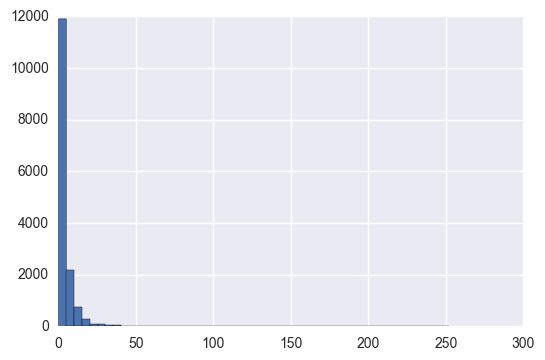

In [8]:
value = 'co2'
df[value].hist(bins=50); 

This is not very useful. Also, since CO2 data can go back to the 1700s, it's not all that relevant. Let's reduce the timeframe.

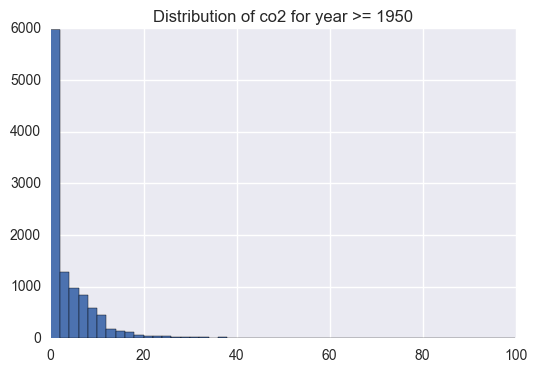

In [117]:
# CO2 dist since 1950

query = 'year >= 1950'

df.query(query)[value].hist(bins=50)
plt.title('Distribution of %s for %s' % (value, query)); 

Interestingly, the range of CO2 emissions has decreased. I suspect this is because coal is no longer a main fuel source. Something to dig into later.

## How does this distribution vary by region?

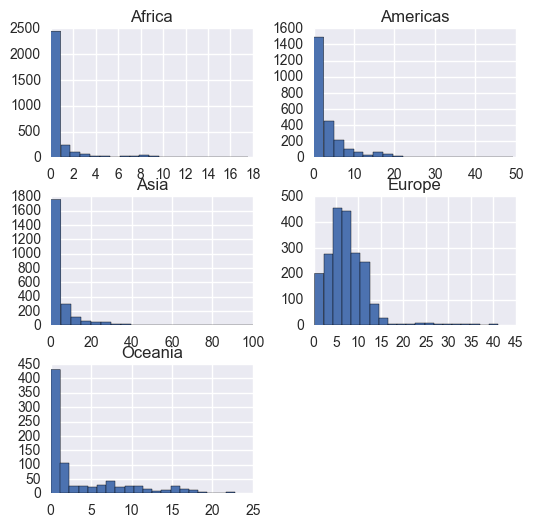

In [10]:
# dist by region

df.query(query).sort_values('region').set_index(['region', 'sub-region','country','year']).\
unstack(level=(0))[value].hist( figsize=(6,6), bins=20);

Europe has the only normal-ish distribution
Negative-skew data, except for Europe which is almost normal. Asia has an exceptionally long tail.

What about outliers?
I can barely make out the long tails in these histograms. Boxplots will highlight where there are outliers.

## How many outliers for each region?

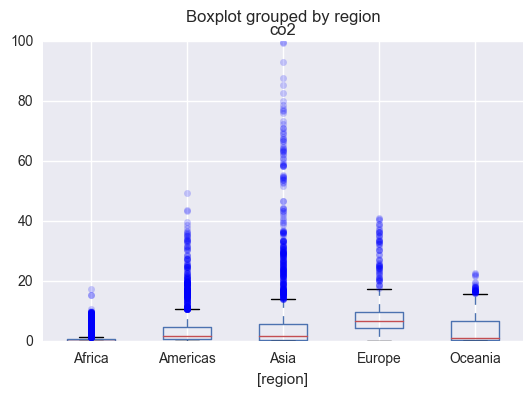

In [11]:
# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

# reshape so region, sub_region & CO2 are columns
df_box = df.query(query).sort_values(['region', 'sub-region']).\
set_index(['region', 'sub-region','country','year'])[value].reset_index(level=(0,1))
                                                                        
df_box.boxplot(by='region', flierprops = flierprops);

#### Observations

*Asia has a lot of extreme outliers*

So which sub-regions are represented by these outliers? Are the outliers spread equally among sub-regions?

### Where are the outliers within each region?

In [12]:
# make boxplot subplots

# split reshaped into smaller regional df's
regions_dfs = [df_box.loc[df_box['region']==region] for region in df_box['region'].unique()]

def make_regional_boxplot(df):
    df.boxplot(by='sub-region', flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

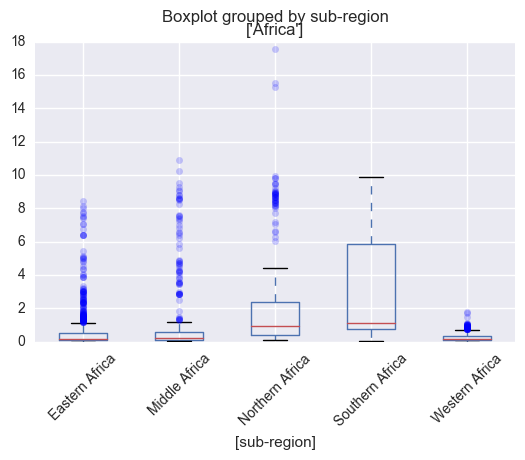

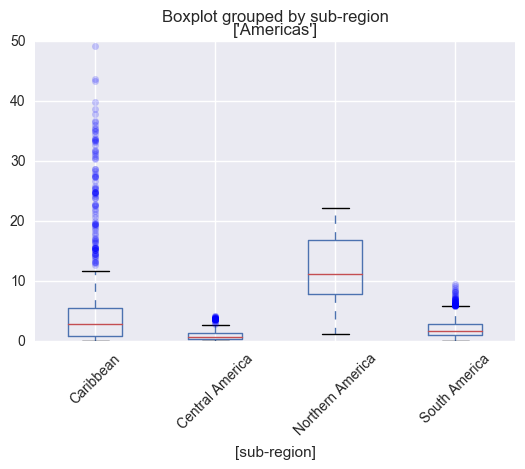

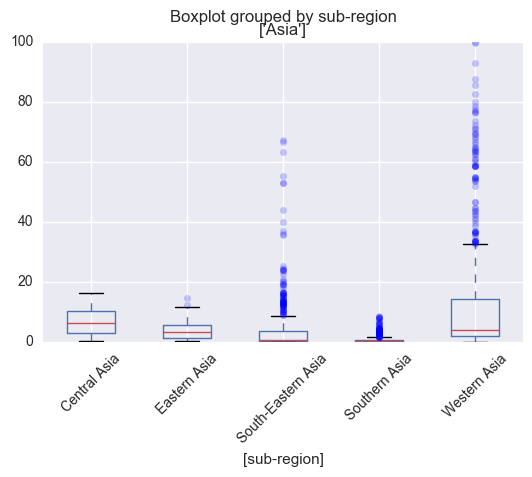

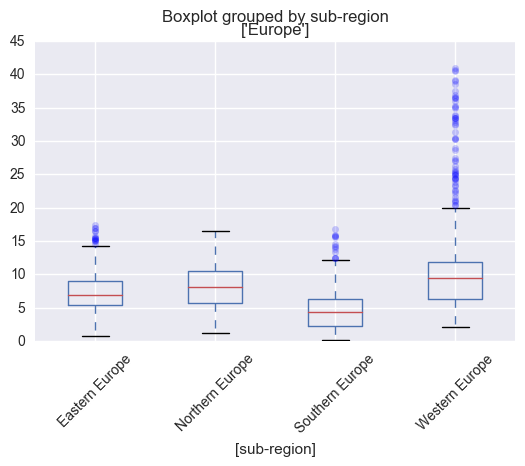

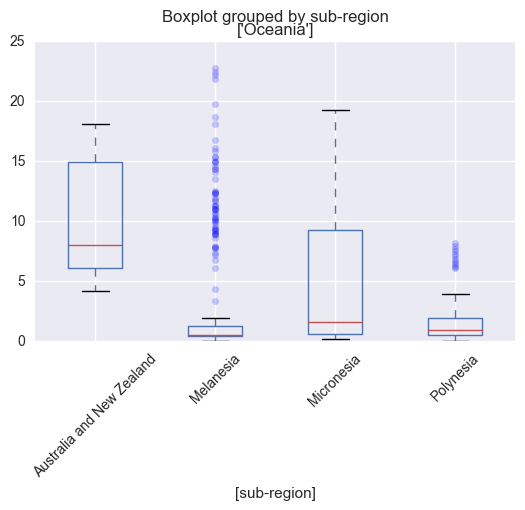

In [13]:
p = pd.Series(regions_dfs).apply(make_regional_boxplot)
p;

#### Observations
**Extreme outliers usually occur in one sub-region**

The most extreme outliers seem to be in Western Asia, probably from the oil-rich countries.

* In Europe, it's Western Europe.
* In the Americas, it's North America.
* In Oceania, it's Melanesia. Although what's an extreme outlier for Melanasia for the most part is just part of the IQR for Australia & New Zealand.

**Americas & Oceania *seem* to have the most variance amongst sub-regions**

But let's quantify that with some stats.

#### Stats

In [246]:
df.query(query).groupby('region').describe()['co2']

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Europe,2075.0,7.574353,5.166964,0.23512,4.58029,6.81016,9.81898,41.03192


Let's create some time-series plots so we can see how CO2 emissions have evolved over time.

### What does this look like over time?
#### Pandas plotting

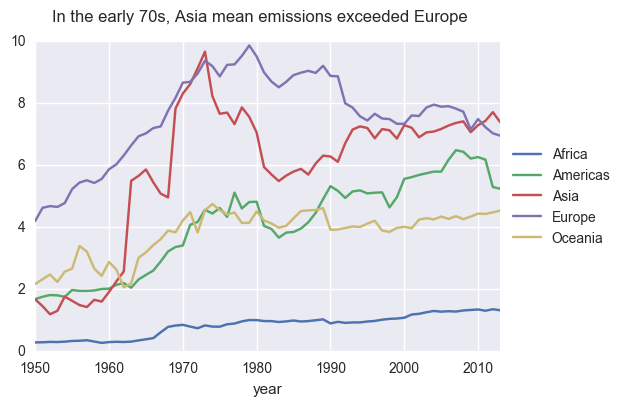

In [50]:
# mean CO2 by year & region
region_year = pd.DataFrame(df.query(query).groupby(['year', 'region']).mean())['co2']

# plot                           
region_year.unstack().plot()
plt.suptitle("In the early 70s, Asia mean emissions exceeded Europe")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

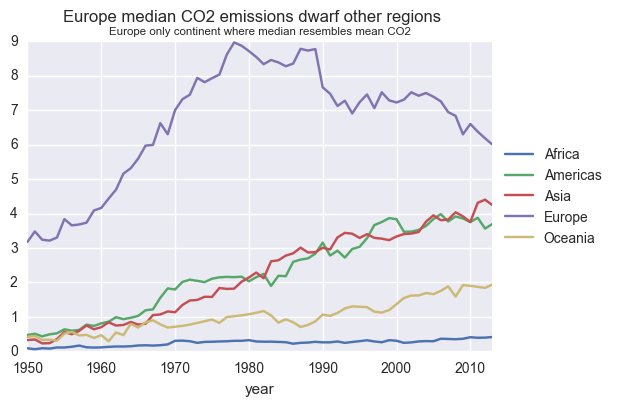

In [240]:
# median CO2 by year & region
region_year = pd.DataFrame(df.query(query).groupby(['year', 'region']).median())['co2']

region_year.unstack().plot()

plt.suptitle("Europe median CO2 emissions dwarf other regions", fontsize='medium', linespacing=10)
plt.title("Europe only continent where median resembles mean CO2", fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

*Impact of the 70s fuel crisis*

* The early 1970s saw a massive spike in mean CO2 in Asia. I suspect this is related to the 'OPEC fuel crisis', where rapid increase in oil prices encouraged more production in the middle-eastern.

*Asia, Americas & Oceania averages are heavily influenced by outliers compared to Europe & Africa*

* For Europe & Africa, there is little discernible difference between plotting mean CO2 & median CO2 emissions.
* For the other regions, the outliers we saw in the boxplots create spiky mean CO2 lines.
* The implication: there is a wide variance of CO2 emissions within Asia, Americas, and Oceania. 
* Hypothesis: These variances correlate to economic output of the regions.

*The overall trend for both mean & median CO2 emissions is upwards*

* Increasing fastest for the Americas & Asia, more gradual for Oceania, and slowly for Africa. 

#### Stats

In [255]:
query = 'year >= 1950'
df.query(query).groupby('region').describe()[value].sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3043.0,0.880661,1.848537,0.00000,0.092185,0.230040,0.648950,17.55229
Oceania,844.0,3.939933,5.102647,0.03220,0.480880,1.124600,6.675767,22.79775
Americas,2548.0,4.193962,5.928220,0.03153,0.815307,1.908275,4.740105,49.29365
Asia,2429.0,6.086236,11.814928,0.00000,0.384450,1.868070,5.898780,99.83136
Europe,2075.0,7.574353,5.166964,0.23512,4.580290,6.810160,9.818980,41.03192


In [257]:
#IQR
df.query(query).groupby('region').describe()[value].sort_values('mean').apply(lambda x: x['75%']-x['25%'], axis=1)

region
Africa      0.556765
Oceania     6.194887
Americas    3.924797
Asia        5.514330
Europe      5.238690
dtype: float64

### Zoom in on Europe
Because I live here.

#### Plots

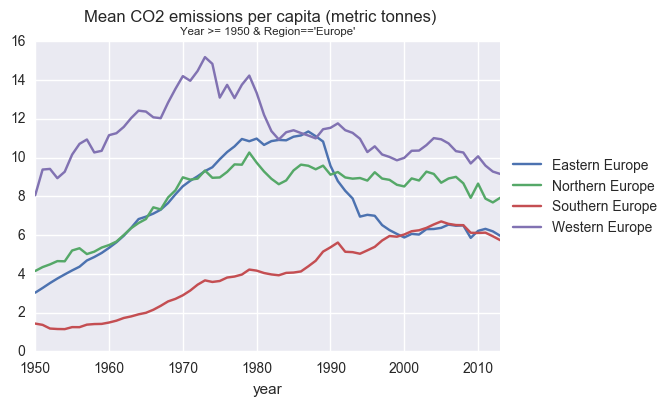

In [232]:
# sub-region averages
q = "year >= 1950 & region=='Europe'"
eur = df.query(q).groupby(['year','region', 'sub-region'])[value].mean().unstack()
eur.reset_index('region').plot()

plt.suptitle('Mean CO2 emissions per capita (metric tonnes)')
plt.title(str.title(q), fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

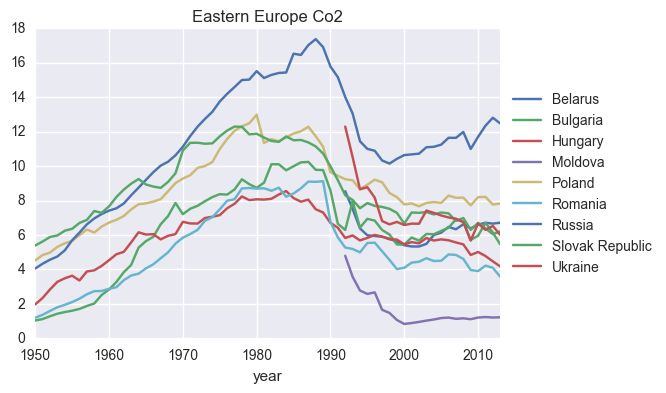

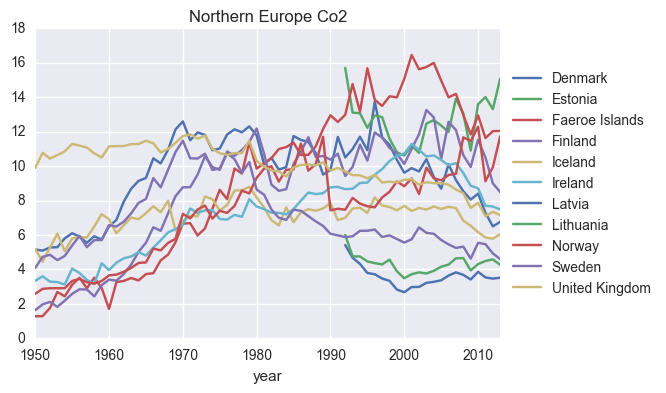

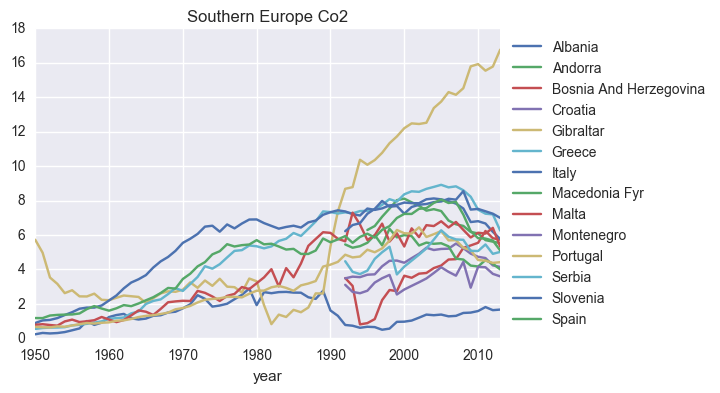

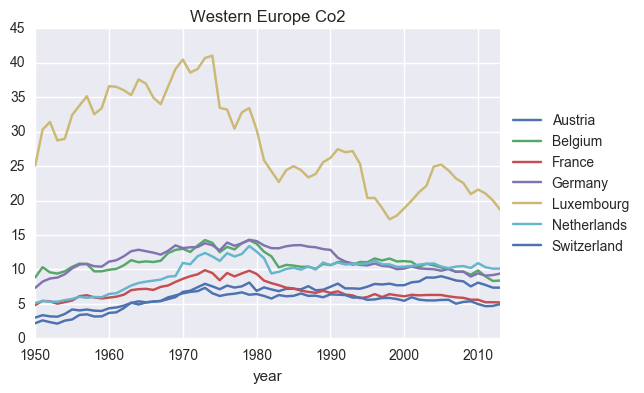

In [239]:
# zoom in on each sub-region
eur = df.query(q)
for subreg in eur['sub-region'].unique():
    regdf = eur.loc[eur['sub-region']==subreg].groupby(['sub-region','country', 'year'])[value].mean().unstack(level=1)
    regdf.reset_index('sub-region').plot()

    plt.title(str.title(subreg + ' %s' % value))
    plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

*What's with Luxembourg & Gibraltar?*

How can tiny countries known for financial services produce so much per capita CO2? 
Similarly, what's going on in the Faroe Islands, another tiny country that's a bit of an outlier for CO2 emissions.

*Lots of noise in the north & south, less so in East & West*

* Even after faceting by sub_region, the N. & S. Europe plots are noisy. 
* E. Europe, made up of entirely of former USSR states, all follow the same pattern and are likely a reflection of the interconnectedness of their economies. 
This might also explain some of the noisiness of N & S Europe, as some ex-Soviet countries are included in these geographic groupings
* Implication: income/GDP should highly correlate with CO2, and is more important than physical location of a country.


With the exception of major outlier Luxembourg, the Western European countries also appear to have parallel p.c. emissions. However, the line representing Luxembourg is just so much higher than the rest, it could just be muting the variations of the other countries.

*Outliers make it hard to compare other countries*

To filter out certain countries, let's create interactive versions of the same plots using plotly.

#### Interactive plots with Plotly + Cufflinks

In [241]:
def plotly_line(df, title):
    fig = df.iplot(asFigure = True,\
                    title = title,\
                    yTitle = str.title("Whatever"),\
                    theme = 'ggplot')
    return fig

def plotly_subreg_timeseries(df, subplot, value):
    for subreg in df[subplot].unique():
        subreg_df = df.loc[df[subplot]==subreg].pivot(index, column, value)
        #print subreg_df.head()
        fig = plotly_line(subreg_df, subreg + ' ' + value)
        py.offline.iplot(fig)

In [242]:
# plot
query = "region=='Europe' & year >= 1950"
subplot = 'sub-region'
index = 'year'
column = 'country'
value = 'co2'

plotly_subreg_timeseries(df.query(query), subplot, value)

########## TO INTERACT WITH PLOT.LY PLOT #########
##### Hide a line: single-click corresponding legend item
##### Isolate a line: double-click legend item
##### Bring back all lines: double-click item a 2nd time
##### Select, zoom, pan: hover on upper right of plot to display toolbar

#### More observations

In most of the sub-regions, the smallest countries tend to have highest avg CO2pc emissions:

* W. Europe: Luxembourg (outlier)
* S. Europe: Gibralter (outlier) and Andorra
* N. Europe: Faroe Islands, Estonia

The notable exception: Eastern Europe, where Russia tops the emissions values.

#### Quantify with stats

In [243]:
# descriptive stats
q = "year >= 1950 & region=='Europe'"
df.query(q).groupby('sub-region').describe()['co2']

,count,mean,std,min,25%,50%,75%,max
sub-region,,,,,,,,
Eastern Europe,450.0,7.312632,3.276749,0.83613,5.488167,6.953765,9.076610,17.37377
Northern Europe,578.0,8.075603,3.121194,1.28026,5.733120,8.083525,10.556385,16.45167
Southern Europe,599.0,4.478714,2.837171,0.23512,2.204225,4.389500,6.243710,16.76391
Western Europe,448.0,11.329578,7.897725,2.13260,6.325897,9.425730,11.909557,41.03192


Wow. 

## Where are CO2 emissions changing the most in last 10 years?

In [300]:
# reshape df so region/countries are columns, and years are the rows
# then calculate 10 yr % change entire DF

q = 'year >= 1950'
co2_change = df.query(q).sort_values(['region', 'sub-region']).set_index(['region','sub-region','country','year']).\
unstack(level=(0,1,2))[value].pct_change(10)

# verify
co2_change.tail()

region             Africa                                                    \
sub-region Eastern Africa                                                     
country           Burundi   Comoros  Djibouti   Eritrea  Ethiopia     Kenya   
year                                                                          
2009            -0.516674  0.193177  0.269607 -0.381503  0.589041 -0.063157   
2010            -0.474889  0.192882  0.318607 -0.364270  0.407900 -0.099785   
2011            -0.163735  0.398029  0.124927 -0.281252  0.351037  0.104959   
2012            -0.060943  0.307199  0.130395 -0.155176  0.445898  0.206959   
2013             0.285780  0.327170  0.263315 -0.277636  0.633261  0.511947   

region                                                     ...         \
sub-region                                                 ...          
country    Madagascar    Malawi Mauritius Mozambique       ...          
year                                                       ...          
2009        -0.312241 -0.205822  0.440120   0.600688       ...          
2010        -0.219412  0.009383  0.381811   0.522334       ...          
2011        -0.005127  0.006320  0.304159   0.532049       ...          
2012         0.619531 -0.040422  0.347196   0.477699       ...          
2013         0.360126 -0.007075  0.164403   0.577886       ...          

region        Oceania                                                          \
sub-region Micronesia                                                           
country      Kiribati Marshall Islands Micronesia Fed Sts     Nauru     Palau   
year                                                                            
2009         0.134380         0.517218           0.490697 -0.567152  0.705862   
2010         0.553188         0.286629          -0.075306 -0.489149  0.782367   
2011         0.992273         0.210388          -0.244804 -0.512708  0.171989   
2012         0.266036         0.137621           0.007659 -0.492001  0.173831   
2013         0.265665         0.116563           0.029867 -0.356456  0.126104   

region                                                                      
sub-region        Polynesia                                                 
country    French Polynesia      Niue     Samoa     Tonga Wallis Et Futuna  
year                                                                        
2009               0.501868  0.938781  0.336871  0.130168              NaN  
2010               0.336233  0.941417  0.383257  0.159150              NaN  
2011               0.093002  0.948107  0.537139  0.100078         0.886996  
2012               0.029494  0.306137  0.653943  0.653725         0.084578  
2013              -0.042132  0.313521  0.479518  0.687513        -0.067825  

[5 rows x 201 columns]

In [298]:
# break down by region & plot heatmaps???

In [304]:
# get max change % for each region

q = 'year == @end_yr'
pd.DataFrame(co2_change.loc[end_yr]).unstack(level=(0)).max(axis=0)

      region  
2013  Africa       1.549343
      Americas     0.909387
      Asia        14.196667
      Europe       0.509562
      Oceania      0.839160
dtype: float64

In [305]:
# what's the minumum change %?
pd.DataFrame(co2_change.loc[end_yr]).unstack(level=0).min(axis=0).sort_values()

      region  
2013  Americas   -0.658141
      Asia       -0.404922
      Europe     -0.359642
      Oceania    -0.356456
      Africa     -0.337868
dtype: float64

In [306]:
# what's the min change % for each sub_region?
pd.DataFrame(co2_change.loc[end_yr]).unstack(level=(0,1)).min(axis=0)

      region    sub-region               
2013  Africa    Eastern Africa              -0.277636
                Middle Africa               -0.337868
                Northern Africa             -0.070706
                Southern Africa             -0.090268
                Western Africa              -0.212065
      Americas  Caribbean                   -0.658141
                Central America             -0.087020
                Northern America            -0.246451
                South America               -0.175155
      Asia      Central Asia                -0.270558
                Eastern Asia                -0.007701
                South-Eastern Asia           0.167856
                Southern Asia                0.048306
                Western Asia                -0.404922
      Europe    Eastern Europe              -0.283041
                Northern Europe             -0.359642
                Southern Europe             -0.325228
                Western Europe          

# Multi-variate analysis

In [407]:
# expand DF to include all columns
df = pd.read_csv(mypath + 'final_df.csv')
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,hdi,income_pc,motor_vehicles_per_1000,population,roads_paved_%,sulfur_emissions_pc_kg,surviving_kids_per_woman
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,1030.0,NaN,NaN,NaN,0.0477,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,1040.0,NaN,7752118.0,NaN,0.0758,2.89
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,1060.0,NaN,7839426.0,NaN,0.0932,2.89
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,1070.0,NaN,7934798.0,NaN,0.1100,3.02
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,1120.0,NaN,8038312.0,NaN,0.1260,3.02


In [409]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                     17055 non-null object
region                      14970 non-null object
sub-region                  14970 non-null object
year                        17055 non-null int64
CO2_pc                      17055 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  12517 non-null float64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [438]:
# convert year to str
df['year'] = df['year'].astype('str')

In [439]:
# convert population to int
# to enable bubble plots later on
df['population'] = df['population'].fillna(0).astype(int)

## Who has the biggest CO footprint?
China? The US? Let's see.

In [348]:
# store last year of data set
end_yr = df['year'].max()
q = 'year==@end_yr'

In [450]:
footprint =  df['CO2_pc'] * df['population']
df['CO2_footprint'] = footprint

#df.query(q).loc[df.query(q)['CO2_footprint'].idxmax()]
df[['country','CO2_pc', 'population', 'CO2_footprint']].loc[df.query(q)['CO2_footprint'].idxmax()]

country                China
CO2_pc               7.52178
population        1362514260
CO2_footprint    1.02485e+10
Name: 3156, dtype: object

In [451]:
val = 'CO2_pc'
df.query(q).iplot(kind='bubble', x='population', y=val, size='CO2_footprint', text='country',\
           xTitle='Population (log scale)', yTitle='CO2 per capita', categories='region', logx=True,\
             title='Who had the biggest CO2 footprint in %s?' % end_yr)

## Correlations

In [356]:
df.corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
energy_use_pc               0.838864
income_pc                   0.712615
motor_vehicles_per_1000     0.618909
hdi                         0.562471
roads_paved_%               0.440285
sulfur_emissions_pc_kg      0.278357
year                        0.171288
CO2_footprint               0.164357
population                  0.008108
surviving_kids_per_woman   -0.146035
Name: CO2_pc, dtype: float64

In [357]:
q = 'year >= 1950'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
energy_use_pc               0.838864
income_pc                   0.770431
motor_vehicles_per_1000     0.618909
hdi                         0.562471
roads_paved_%               0.440285
sulfur_emissions_pc_kg      0.209800
CO2_footprint               0.160327
year                        0.074677
population                 -0.011861
surviving_kids_per_woman   -0.248434
Name: CO2_pc, dtype: float64

In [358]:
q = 'year >= 1990'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                      1.000000
energy_use_pc               0.910818
income_pc                   0.829314
motor_vehicles_per_1000     0.618909
hdi                         0.562471
roads_paved_%               0.440285
CO2_footprint               0.154302
sulfur_emissions_pc_kg      0.071080
year                        0.020189
population                 -0.029636
surviving_kids_per_woman   -0.375943
Name: CO2_pc, dtype: float64

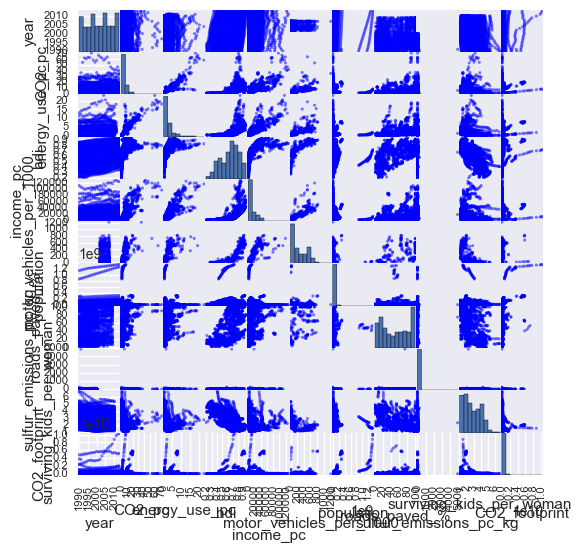

In [364]:
from pandas.plotting import scatter_matrix
scatter_matrix(df.query(q), figsize=(6,6));

In [373]:
# by region
df.groupby('region').corr()[val].unstack().T\
.drop('year')

region,Africa,Americas,Asia,Europe,Oceania
CO2_footprint,0.577153,0.434174,0.006105,0.364527,0.573349
CO2_pc,1.000000,1.000000,1.000000,1.000000,1.000000
energy_use_pc,0.934073,0.989642,0.828900,0.720363,0.942252
hdi,0.687768,0.715294,0.564164,0.392944,0.795081
income_pc,0.805511,0.739598,0.712140,0.652739,0.886580
motor_vehicles_per_1000,0.842523,0.836896,0.652249,0.497863,0.729555
population,0.070594,0.331374,-0.078359,0.320769,0.527088
roads_paved_%,0.406781,0.382421,0.299878,0.183940,0.533072
sulfur_emissions_pc_kg,0.271837,0.730336,0.194343,0.618787,0.874225
surviving_kids_per_woman,-0.107555,-0.352267,0.160809,-0.432844,-0.627450


In [371]:
# how many missing regions?
len(df['country'][df['region'].isnull()].unique())

41

### Observations

#### Energy, then Income have highest correlation with CO2 p.c. emissions

Motor vehicle ownership & HDI also show strong correlations. 
Kids surviving to 35 have a moderate negative correlation overall, and a strong negative correlation for Oceania.

Another exception for Oceania is sulfur emissions: it has the highest correlation with CO2 emissions for Oceania, whereas it is small everwhere else.

But to what extent are HDI scores, vehicle ownership, and surviving kids (i.e. family size) just proxies for income? 

## Is there a lot of variation in correlations within regions?

In [378]:
# further break down CO2 correlation matrix by sub_region
co2_corr = df.query(q).groupby(['region', 'sub-region']).corr()[val]
co2_corr = co2_corr.unstack(level=(0,1))

co2_corr

region                           Africa                                \
sub-region               Eastern Africa Middle Africa Northern Africa   
CO2_footprint                  0.130481      0.269600        0.368124   
CO2_pc                         1.000000      1.000000        1.000000   
energy_use_pc                  0.906435      0.952664        0.921078   
hdi                            0.721438      0.681969        0.722800   
income_pc                      0.882145      0.903910        0.867184   
motor_vehicles_per_1000        0.840034      1.000000        0.979458   
population                    -0.237047     -0.336027        0.012846   
roads_paved_%                  0.696210      0.206060        0.128548   
sulfur_emissions_pc_kg         0.283650      0.881406       -0.022045   
surviving_kids_per_woman      -0.236820      0.004893        0.098328   

region                                                   Americas  \
sub-region               Southern Africa Western Africa Caribbean   
CO2_footprint                   0.891072       0.455887  0.072339   
CO2_pc                          1.000000       1.000000  1.000000   
energy_use_pc                   0.988265       0.537214  0.942434   
hdi                             0.584296       0.800090  0.827630   
income_pc                       0.679563       0.639548  0.521331   
motor_vehicles_per_1000         0.928929       0.797693  0.680472   
population                      0.904141       0.340863 -0.183512   
roads_paved_%                   0.115806       0.483799  0.588909   
sulfur_emissions_pc_kg          0.305892       0.078143  0.887608   
surviving_kids_per_woman       -0.265480       0.231330 -0.204471   

region                                                                   \
sub-region               Central America Northern America South America   
CO2_footprint                   0.734241         0.622013      0.334210   
CO2_pc                          1.000000         1.000000      1.000000   
energy_use_pc                   0.968819         0.749871      0.945496   
hdi                             0.679012        -0.058106      0.501506   
income_pc                       0.727638         0.837599      0.762160   
motor_vehicles_per_1000         0.798706         0.851779      0.635150   
population                      0.714616         0.622153      0.070923   
roads_paved_%                   0.665425         0.950172      0.747743   
sulfur_emissions_pc_kg          0.368461         0.382027      0.314851   
surviving_kids_per_woman       -0.327330        -0.764205     -0.049237   

region                           Asia    ...                                \
sub-region               Central Asia    ...    Southern Asia Western Asia   
CO2_footprint                0.714832    ...         0.338908     0.117659   
CO2_pc                       1.000000    ...         1.000000     1.000000   
energy_use_pc                0.975330    ...         0.957748     0.828053   
hdi                          0.861103    ...         0.602319     0.511080   
income_pc                    0.849506    ...         0.896320     0.777318   
motor_vehicles_per_1000      0.913887    ...        -0.125493     0.644417   
population                   0.029547    ...         0.029618    -0.157731   
roads_paved_%               -0.048692    ...         0.342246     0.073201   
sulfur_emissions_pc_kg       0.676755    ...         0.692055     0.083487   
surviving_kids_per_woman    -0.698980    ...        -0.121348     0.122962   

region                           Europe                                  \
sub-region               Eastern Europe Northern Europe Southern Europe   
CO2_footprint                  0.660453        0.379347        0.467632   
CO2_pc                         1.000000        1.000000        1.000000   
energy_use_pc                  0.865330        0.141552        0.941884   
hdi                            0.331974        0.217064        0.764878   
income

### Observations
In North America, Family Size (Surviving Kids) has a positive correlation
There are fascinating descrepancies within the regions as well.

For example, North America is the only sub_region in the world where the more adult children in a family, the higher the per capita CO2 emissions.

Another unique exception in N. America: Energy has an exceptionally low correlation. But the correlation with motor vehicle ownership & % roads paved is the highest in the Americas.

## Are the regional breakdowns too arbitrary?

In some regions, there are 'gorillas' that could skew the numbers, such as the US in the Americas, or Australia for Oceania.

Looking at the bubble plots, in each region there seems to be an invisible line dividing a few high-income/energy/CO2 emitting countries from the mass of countries clustered in the bottom left.

In other words, do the 'have' countries emit CO2 for different reasons than the have-not countries, regardless of where they are located?

In [440]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                     17055 non-null object
region                      14970 non-null object
sub-region                  14970 non-null object
year                        17055 non-null object
CO2_pc                      17055 non-null float64
energy_use_pc               5324 non-null float64
hdi                         3898 non-null float64
income_pc                   14969 non-null float64
motor_vehicles_per_1000     456 non-null float64
population                  17055 non-null int64
roads_paved_%               1977 non-null float64
sulfur_emissions_pc_kg      11230 non-null float64
surviving_kids_per_woman    13919 non-null float64
dtypes: float64(8), int64(1), object(4)
memory usage: 1.7+ MB


In [435]:
plot_cols = [col for col in df.columns[5:]]
plot_cols

['energy_use_pc',
 'hdi',
 'income_pc',
 'motor_vehicles_per_1000',
 'population',
 'roads_paved_%',
 'sulfur_emissions_pc_kg',
 'surviving_kids_per_woman']

In [476]:
df['year'].loc[df[col].last_valid_index()]

'2010'

In [477]:
for col in plot_cols:
    last_valid = df['year'].loc[df[col].last_valid_index()]
    q = "year == @last_valid"
    y = 'CO2_pc'
    x = col
    size= 'CO2_footprint'
    cat_col = 'hdi'
    plot_bubble(df.query(q), x)
    #plot_bubble_with_cuts(df.query(q), cat_col)

In [426]:
# compare income to surviving kids by HDI level
# TODO: update plot_bubble_with_cuts() to use qcuts instead?

q = "year == '2010'" # no 'Surviving' data after this year
x = 'income_pc'
y = 'surviving_kids_per_woman'
size = 'CO2_footprint'
cat_col = 'hdi'

plot_bubble_with_cuts(df.query(q), cat_col)

In [428]:
# compare on income levels
query = 'year == @end_yr'
x = 'income_pc'
y = 'CO2_pc'
size = 'CO2_footprint'
cat_col = 'hdi'

plot_bubble_with_cuts(df.query(query), cat_col)

In [ ]:
# look at the distributions by HDI level

# reshape so region, sub_region & CO2 are columns
#df_box = df.sort_values('hdi_level').set_index(['hdi_level', 'country'])['CO2']
#df_box.reset_index('country').boxplot(by='hdi_level', showfliers=False);